# Pre Test set

x is 224 and y is 224 and z is 11
(50176, 11)


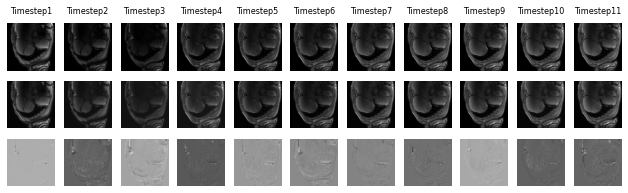

In [1]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
from hyperspy.learn.rpca import rpca_godec, orpca
path = 'data/MOLLI_post_dataset/test/0387056_20140423_MOLLI_3.npy'
vols = np.load(path).transpose(1, 2, 0)
x, y, z = vols.shape
print(f"x is {x} and y is {y} and z is {z}")
M = vols.reshape(x*y, z)
print(M.shape)
low, sparse, U, S, V = rpca_godec(M, rank=5)
low_matrix = low.reshape((x, y, z))
sparse_matrix = sparse.reshape((x, y, z))

fig = plt.figure(figsize=(11, 3))
title_font_size=8
title_pad = 10
for i in range(z):
    ax1 = fig.add_subplot(3, 11, 1+i)
    plt.imshow(vols[..., i], cmap='gray')
    plt.axis('off')
    ax1.set_title(f"Timestep{i+1}", fontsize=title_font_size, pad=title_pad)

    ax2 = fig.add_subplot(3, 11, 12+i)
    plt.imshow(low_matrix[..., i], cmap='gray')
    plt.axis('off')

    ax3 = fig.add_subplot(3, 11, 23+i)
    plt.imshow(sparse_matrix[..., i], cmap='gray')
    plt.axis('off')

In [2]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [3]:
from scripts.utils import *
orig_path = 'data/MOLLI_post_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.8590354716904918


#### T1 fitting

In [4]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_t1_changes(fig, path, subject_list, orig_t1err_square_list, orig_t1err_heart_list):
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)
        SD_err = fd['S']
        areamask = fd['areamask']
        itemindex = np.where(areamask == 1)
        x1, x2 = itemindex[0][0], itemindex[0][-1]
        y1, y2 = itemindex[1][0], itemindex[1][-1]
        heartmask = fd['epi_BW']
        errmap = SD_err * areamask

        orig_t1err_square_list.append(np.mean(errmap[areamask==1]))
        fig.add_subplot(10, 4, 1+i*4)
        ax = plt.gca()
        im = ax.imshow(errmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=30)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        fig.add_subplot(10, 4, 2+i*4)
        ax = plt.gca()
        im = ax.imshow(t1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=1000)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        orig_t1err_heart_list.append(np.mean(hearterrmap[heartmask==1]))

        fig.add_subplot(10, 4, 3+i*4)
        ax = plt.gca()
        im = ax.imshow(hearterrmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=30)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(10, 4, 4+i*4)
        ax = plt.gca()
        im = ax.imshow(heartt1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=1000)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list

Mean of t1err is 6.7522509602559895 and std is 2.1794916333878387
Mean of t1err is 5.297546666081299 and std is 1.6881772144802307


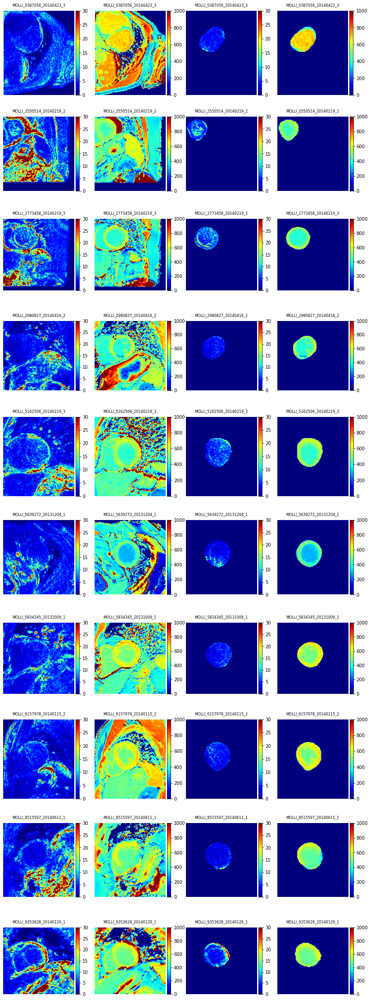

In [5]:
path = "data/MOLLI_post_dataset/T1_SDerr"
# print(path)
fig = plt.figure(figsize=(12,36))
title_font_size=8
title_pad = 10
orig_t1err_square_list = []
orig_t1err_heart_list = []
subject_list = []

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list = plot_t1_changes(fig, path, subject_list, orig_t1err_square_list, orig_t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(orig_t1err_square_list))} and std is {np.std(np.array(orig_t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(orig_t1err_heart_list))} and std is {np.std(np.array(orig_t1err_heart_list))}")
plt.savefig(f"data/MOLLI_post_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw Heart T1err'] = orig_t1err_heart_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

### Round 1

In [6]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [7]:
r = 1
root = f"results/MOLLI_pre/group/rank_5_5_5_5_5_5_5/nmi/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e80/test_MOLLI_post"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [8]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.8637929462026799 and std is 0.021528442501844672


#### Jacobian Determination

In [9]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.002268625423312187


#### T1 fitting

Mean of t1err is 6.208020434258839 and std is 2.003575771970735
Mean of t1err is 5.011495111586397 and std is 1.6158876865517788


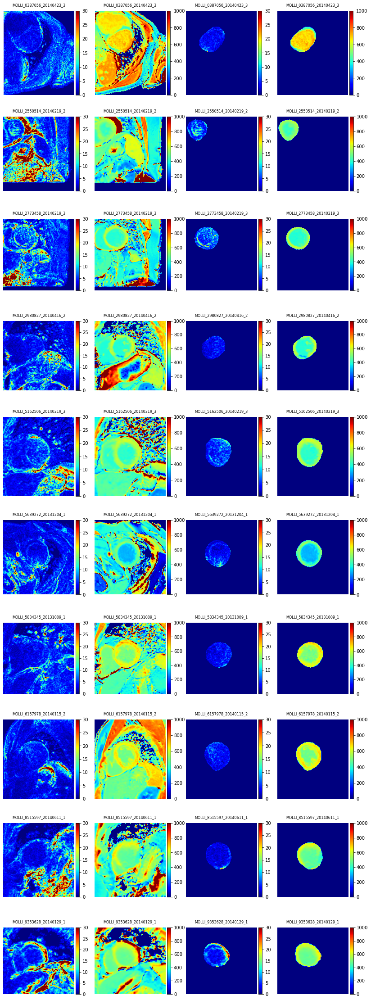

In [10]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R1 Square T1err'] = t1err_square_list
df['R1 Heart T1err'] = t1err_heart_list
df_2['R1 PCA'] = pca_changes
df_2['R1 Det'] = mag_det_jac_det_list
df_2['R1 Fold ratio'] = folding_ratio_list

### Round 2

In [11]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [12]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8665325597462956 and std is 0.020981610093754106


#### Jacobian Determination

In [13]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0016026252415031195


#### T1 fitting

Mean of t1err is 5.936394157273805 and std is 1.8545286210842844
Mean of t1err is 4.855854944627451 and std is 1.5603851535567423


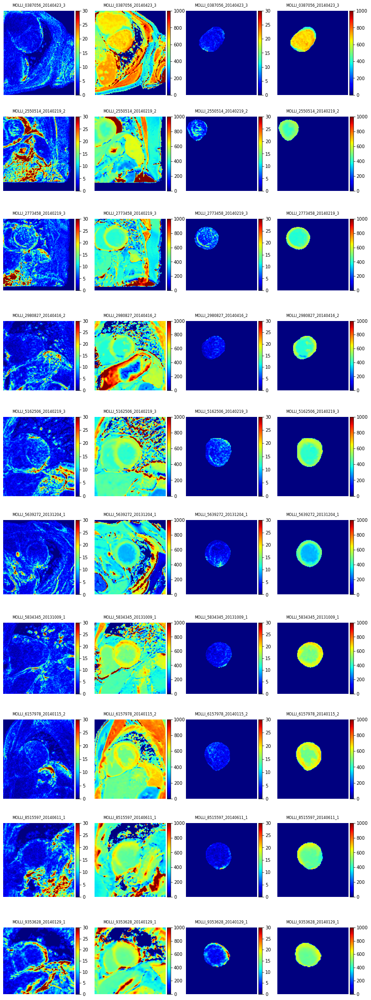

In [14]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R2 Square T1err'] = t1err_square_list
df['R2 Heart T1err'] = t1err_heart_list
df_2['R2 PCA'] = pca_changes
df_2['R2 Det'] = mag_det_jac_det_list
df_2['R2 Fold ratio'] = folding_ratio_list

### Round 3

In [15]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [16]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.8684265255210357 and std is 0.020599096030722772


#### Jacobian Determination

In [17]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0017146279569715261


#### T1 fitting

Mean of t1err is 5.816486899833012 and std is 1.7542522905121147
Mean of t1err is 4.733146575947034 and std is 1.5225837576201895


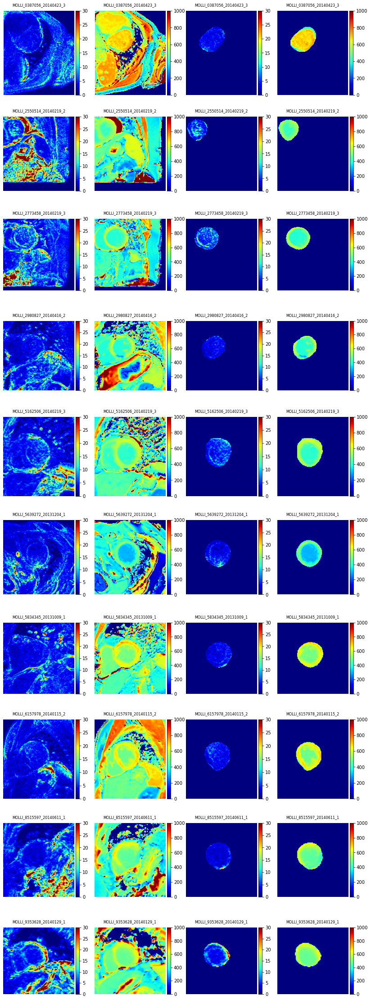

In [18]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R3 Square T1err'] = t1err_square_list
df['R3 Heart T1err'] = t1err_heart_list
df_2['R3 PCA'] = pca_changes
df_2['R3 Det'] = mag_det_jac_det_list
df_2['R3 Fold ratio'] = folding_ratio_list

### Round 4

In [19]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [20]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8693190524962772 and std is 0.020329571301474173


#### Jacobian Determination

In [21]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0011093617649748921


#### T1 fitting

Mean of t1err is 5.7091777790086535 and std is 1.713727544344315
Mean of t1err is 4.618246178508462 and std is 1.4566060735188975


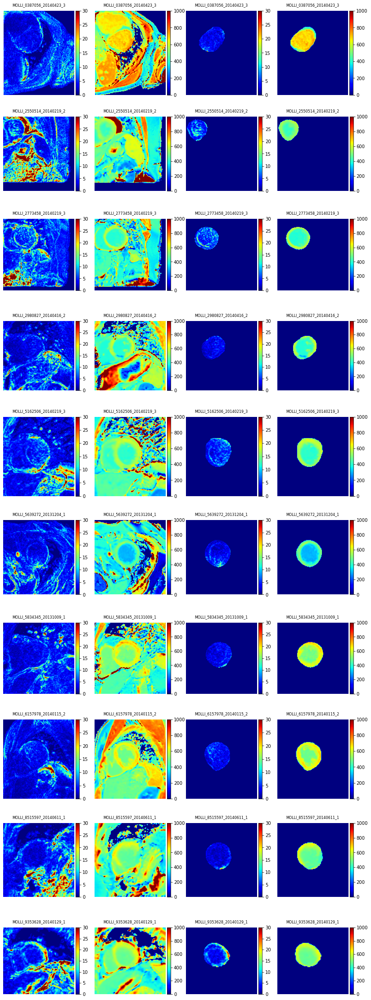

In [22]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R4 Square T1err'] = t1err_square_list
df['R4 Heart T1err'] = t1err_heart_list
df_2['R4 PCA'] = pca_changes
df_2['R4 Det'] = mag_det_jac_det_list
df_2['R4 Fold ratio'] = folding_ratio_list

### Round 5

In [23]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [24]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8702300096659318 and std is 0.020203357792493836


#### Jacobian Determination

In [25]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0009457830456085503


#### T1 fitting

Mean of t1err is 5.616498931516071 and std is 1.6527768733837884
Mean of t1err is 4.542780372044112 and std is 1.4448208395578568


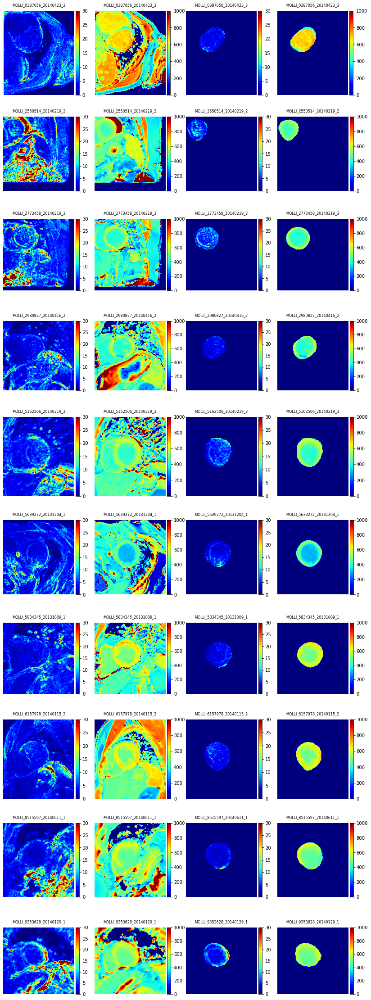

In [26]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R5 Square T1err'] = t1err_square_list
df['R5 Heart T1err'] = t1err_heart_list
df_2['R5 PCA'] = pca_changes
df_2['R5 Det'] = mag_det_jac_det_list
df_2['R5 Fold ratio'] = folding_ratio_list

### Round 6

In [27]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [28]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8709678191063391 and std is 0.020147851989549187


#### Jacobian Determination

In [29]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0008347457041963935


#### T1 fitting

Mean of t1err is 5.540552668636178 and std is 1.6216204892118433
Mean of t1err is 4.417042279065304 and std is 1.3866307990239735


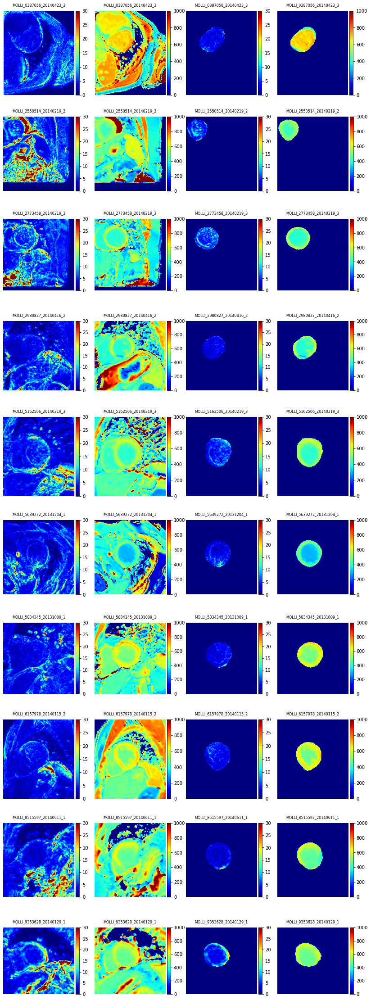

In [30]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R6 Square T1err'] = t1err_square_list
df['R6 Heart T1err'] = t1err_heart_list
df_2['R6 PCA'] = pca_changes
df_2['R6 Det'] = mag_det_jac_det_list
df_2['R6 Fold ratio'] = folding_ratio_list

### Round 7

In [31]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [32]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8714032266908764 and std is 0.020092518340981778


#### Jacobian Determination

In [33]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0006567054660990834


#### T1 fitting

Mean of t1err is 5.495223256958707 and std is 1.605469334012149
Mean of t1err is 4.377689296969716 and std is 1.38400187970934


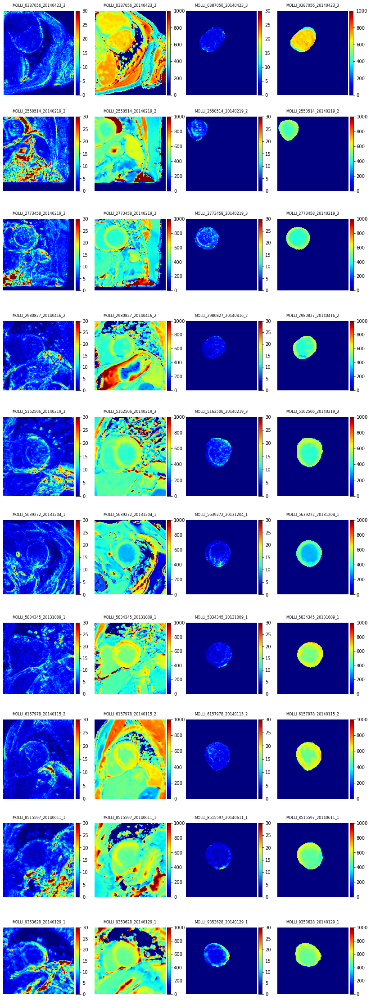

In [34]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R7 Square T1err'] = t1err_square_list
df['R7 Heart T1err'] = t1err_heart_list
df_2['R7 PCA'] = pca_changes
df_2['R7 Det'] = mag_det_jac_det_list
df_2['R7 Fold ratio'] = folding_ratio_list

### Summary

In [35]:
df

,Cases,Raw Square T1err,Raw Heart T1err,R1 Square T1err,R1 Heart T1err,R2 Square T1err,R2 Heart T1err,R3 Square T1err,R3 Heart T1err,R4 Square T1err,R4 Heart T1err,R5 Square T1err,R5 Heart T1err,R6 Square T1err,R6 Heart T1err,R7 Square T1err,R7 Heart T1err
0,MOLLI_0387056_20140423_3,4.365528,4.276875,4.198293,3.929220,4.127298,3.817966,4.141513,3.708264,4.095690,3.628247,4.097733,3.512939,4.054785,3.477832,4.039510,3.396056
1,MOLLI_2550514_20140219_2,11.222237,7.210080,10.464649,6.736894,9.929897,6.634920,9.517661,6.366103,9.348108,6.291549,9.129202,6.052034,8.997479,5.883334,8.920295,5.819480
2,MOLLI_2773458_20140219_3,7.986917,7.838970,7.205151,7.294913,6.885583,7.078230,6.832794,6.904812,6.790966,6.740191,6.712078,6.692459,6.666790,6.570510,6.615144,6.518743
3,MOLLI_2980827_20140416_2,5.584256,3.600143,5.132204,3.521288,4.831367,3.392520,4.731972,3.249214,4.591601,3.167557,4.500976,3.068457,4.396617,2.921605,4.363575,2.914361
4,MOLLI_5162506_20140219_3,6.906262,6.091785,6.134622,5.801818,5.860113,5.741341,5.722435,5.595872,5.627345,5.491826,5.515110,5.488532,5.430037,5.335213,5.378864,5.318502
5,MOLLI_5639272_20131204_1,4.647820,4.316735,4.589056,4.108962,4.546763,3.929105,4.538742,3.891744,4.560515,3.860159,4.544875,3.804562,4.546249,3.764490,4.517464,3.759712
6,MOLLI_5834345_20131009_1,5.346733,4.101917,4.682542,3.720514,4.523443,3.567831,4.401147,3.491730,4.240594,3.396295,4.159082,3.346890,4.094843,3.280315,4.052333,3.233564
7,MOLLI_6157978_20140115_2,4.345653,4.279712,3.911572,4.053102,3.790419,3.991308,3.758122,3.885953,3.716574,3.849510,3.706219,3.815274,3.681800,3.754628,3.650892,3.717234
8,MOLLI_8515597_20140611_1,8.249505,3.373413,7.816573,3.229624,7.328532,3.112750,7.188321,3.052634,7.045918,2.971690,6.885938,2.927853,6.780045,2.821917,6.703411,2.772623
9,MOLLI_9353628_20140129_1,8.867598,7.885836,7.945542,7.718616,7.540527,7.292578,7.332163,7.185139,7.074467,6.785438,6.913776,6.718804,6.756882,6.360580,6.710745,6.326617


In [36]:
df.describe()

,Raw Square T1err,Raw Heart T1err,R1 Square T1err,R1 Heart T1err,R2 Square T1err,R2 Heart T1err,R3 Square T1err,R3 Heart T1err,R4 Square T1err,R4 Heart T1err,R5 Square T1err,R5 Heart T1err,R6 Square T1err,R6 Heart T1err,R7 Square T1err,R7 Heart T1err
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,6.752251,5.297547,6.208020,5.011495,5.936394,4.855855,5.816487,4.733147,5.709178,4.618246,5.616499,4.542780,5.540553,4.417042,5.495223,4.377689
std,2.297386,1.779495,2.111954,1.703295,1.954845,1.644790,1.849144,1.604944,1.806427,1.535398,1.742180,1.522975,1.709338,1.461637,1.692313,1.458866
min,4.345653,3.373413,3.911572,3.229624,3.790419,3.112750,3.758122,3.052634,3.716574,2.971690,3.706219,2.927853,3.681800,2.821917,3.650892,2.772623
25%,4.822548,4.145657,4.612428,3.772691,4.529273,3.630365,4.435546,3.545863,4.320574,3.454283,4.244556,3.388402,4.170287,3.329694,4.130144,3.274187
50%,6.245259,4.298224,5.633413,4.081032,5.345740,3.960206,5.227203,3.888849,5.109473,3.854834,5.029993,3.809918,4.988143,3.759559,4.948164,3.738473
75%,8.183858,6.930506,7.663718,6.503125,7.217795,6.411525,7.099439,6.173546,6.982180,6.091618,6.842473,5.911159,6.734359,5.746304,6.681344,5.694236
max,11.222237,7.885836,10.464649,7.718616,9.929897,7.292578,9.517661,7.185139,9.348108,6.785438,9.129202,6.718804,8.997479,6.570510,8.920295,6.518743


In [37]:
df['R7/Raw Square %'] = (df['Raw Square T1err'] - df['R7 Square T1err']) / df['Raw Square T1err']
df['R7/Raw Heart %'] = (df['Raw Heart T1err'] - df['R7 Heart T1err']) / df['Raw Heart T1err']
df['R1/Raw Heart %'] = (df['Raw Heart T1err'] - df['R1 Heart T1err']) / df['Raw Heart T1err']
df['R2/Raw Heart %'] = (df['Raw Heart T1err'] - df['R2 Heart T1err']) / df['Raw Heart T1err']
df['R3/Raw Heart %'] = (df['Raw Heart T1err'] - df['R3 Heart T1err']) / df['Raw Heart T1err']
df['R4/Raw Heart %'] = (df['Raw Heart T1err'] - df['R4 Heart T1err']) / df['Raw Heart T1err']
df['R5/Raw Heart %'] = (df['Raw Heart T1err'] - df['R5 Heart T1err']) / df['Raw Heart T1err']
df['R6/Raw Heart %'] = (df['Raw Heart T1err'] - df['R6 Heart T1err']) / df['Raw Heart T1err']
df['R7/Raw Heart %'] = (df['Raw Heart T1err'] - df['R7 Heart T1err']) / df['Raw Heart T1err']
df.describe()

,Raw Square T1err,Raw Heart T1err,R1 Square T1err,R1 Heart T1err,R2 Square T1err,R2 Heart T1err,R3 Square T1err,R3 Heart T1err,R4 Square T1err,R4 Heart T1err,...,R7 Square T1err,R7 Heart T1err,R7/Raw Square %,R7/Raw Heart %,R1/Raw Heart %,R2/Raw Heart %,R3/Raw Heart %,R4/Raw Heart %,R5/Raw Heart %,R6/Raw Heart %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,6.752251,5.297547,6.208020,5.011495,5.936394,4.855855,5.816487,4.733147,5.709178,4.618246,...,5.495223,4.377689,0.175197,0.173264,0.054372,0.083921,0.107122,0.127481,0.142351,0.165315
std,2.297386,1.779495,2.111954,1.703295,1.954845,1.644790,1.849144,1.604944,1.806427,1.535398,...,1.692313,1.458866,0.071607,0.032869,0.023445,0.022831,0.021553,0.023660,0.028193,0.030337
min,4.345653,3.373413,3.911572,3.229624,3.790419,3.112750,3.758122,3.052634,3.716574,2.971690,...,3.650892,2.772623,0.028047,0.126939,0.021205,0.057527,0.081407,0.098487,0.099027,0.122692
25%,4.822548,4.145657,4.612428,3.772691,4.529273,3.630365,4.435546,3.545863,4.320574,3.454283,...,4.130144,3.274187,0.162844,0.140676,0.043868,0.069349,0.092777,0.109098,0.122006,0.136402
50%,6.245259,4.298224,5.633413,4.081032,5.345740,3.960206,5.227203,3.888849,5.109473,3.854834,...,4.948164,3.738473,0.196270,0.184291,0.050541,0.078521,0.097964,0.123777,0.146971,0.173748
75%,8.183858,6.930506,7.663718,6.503125,7.217795,6.411525,7.099439,6.173546,6.982180,6.091618,...,6.681344,5.694236,0.220519,0.196510,0.068460,0.095234,0.118640,0.140012,0.157459,0.188064
max,11.222237,7.885836,10.464649,7.718616,9.929897,7.292578,9.517661,7.185139,9.348108,6.785438,...,8.920295,6.518743,0.243229,0.211694,0.092982,0.130204,0.148757,0.172023,0.184067,0.200297


In [38]:
df_2

,Cases,Raw PCA,R1 PCA,R1 Det,R1 Fold ratio,R2 PCA,R2 Det,R2 Fold ratio,R3 PCA,R3 Det,...,R4 Fold ratio,R5 PCA,R5 Det,R5 Fold ratio,R6 PCA,R6 Det,R6 Fold ratio,R7 PCA,R7 Det,R7 Fold ratio
0,MOLLI_0387056_20140423_3,0.882389,0.885269,0.001832,0.0,0.887147,0.001334,0.0,0.887147,0.001334,...,0.0,0.889935,0.000975,0.0,0.890578,0.000755,0.0,0.890993,0.000595,0.0
1,MOLLI_2550514_20140219_2,0.835710,0.844430,0.002468,0.0,0.847706,0.001649,0.0,0.847706,0.001649,...,0.0,0.853432,0.000962,0.0,0.854244,0.000827,0.0,0.854801,0.000650,0.0
2,MOLLI_2773458_20140219_3,0.865327,0.872020,0.002331,0.0,0.874588,0.001570,0.0,0.874588,0.001570,...,0.0,0.879805,0.000949,0.0,0.880404,0.000828,0.0,0.880904,0.000682,0.0
3,MOLLI_2980827_20140416_2,0.871994,0.874979,0.002266,0.0,0.877487,0.001522,0.0,0.877487,0.001522,...,0.0,0.880833,0.000887,0.0,0.881703,0.000795,0.0,0.882152,0.000623,0.0
4,MOLLI_5162506_20140219_3,0.867819,0.872128,0.002245,0.0,0.875919,0.001697,0.0,0.875919,0.001697,...,0.0,0.879199,0.000944,0.0,0.880212,0.000827,0.0,0.880717,0.000699,0.0
5,MOLLI_5639272_20131204_1,0.860272,0.863375,0.002050,0.0,0.865771,0.001623,0.0,0.865771,0.001623,...,0.0,0.869786,0.000945,0.0,0.870165,0.000871,0.0,0.870679,0.000625,0.0
6,MOLLI_5834345_20131009_1,0.840623,0.846675,0.002543,0.0,0.849561,0.001767,0.0,0.849561,0.001767,...,0.0,0.853639,0.000931,0.0,0.854497,0.000820,0.0,0.854857,0.000685,0.0
7,MOLLI_6157978_20140115_2,0.899037,0.901367,0.002075,0.0,0.902689,0.001413,0.0,0.902689,0.001413,...,0.0,0.903965,0.000888,0.0,0.904562,0.000805,0.0,0.904732,0.000611,0.0
8,MOLLI_8515597_20140611_1,0.815625,0.821722,0.002570,0.0,0.825307,0.001830,0.0,0.825307,0.001830,...,0.0,0.829655,0.001018,0.0,0.830489,0.000926,0.0,0.830995,0.000751,0.0
9,MOLLI_9353628_20140129_1,0.851559,0.855964,0.002306,0.0,0.859153,0.001621,0.0,0.859153,0.001621,...,0.0,0.862051,0.000960,0.0,0.862825,0.000894,0.0,0.863203,0.000647,0.0


In [39]:
df2 = df_2.drop(['R1 Fold ratio', 'R2 Fold ratio', 'R3 Fold ratio', 'R4 Fold ratio', 'R5 Fold ratio', 'R6 Fold ratio', 'R7 Fold ratio'], axis=1)
df2['R1/Raw PCA %'] = (df2['R1 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R2/Raw PCA %'] = (df2['R2 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R3/Raw PCA %'] = (df2['R3 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R4/Raw PCA %'] = (df2['R4 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R5/Raw PCA %'] = (df2['R5 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R6/Raw PCA %'] = (df2['R6 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R7/Raw PCA %'] = (df2['R7 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2.describe()

,Raw PCA,R1 PCA,R1 Det,R2 PCA,R2 Det,R3 PCA,R3 Det,R4 PCA,R4 Det,R5 PCA,...,R6 Det,R7 PCA,R7 Det,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.859035,0.863793,0.002269,0.866533,0.001603,0.866533,0.001603,0.869319,0.001109,0.870230,...,0.000835,0.871403,0.000657,0.005587,0.008795,0.008795,0.012063,0.013129,0.013990,0.014499
std,0.024164,0.022693,0.000233,0.022117,0.000151,0.022117,0.000151,0.021429,0.000088,0.021296,...,0.000050,0.021179,0.000048,0.002534,0.003226,0.003226,0.004374,0.004639,0.004735,0.004837
min,0.815625,0.821722,0.001832,0.825307,0.001334,0.825307,0.001334,0.828624,0.000898,0.829655,...,0.000755,0.830995,0.000595,0.002592,0.004062,0.004062,0.004908,0.005482,0.006146,0.006335
25%,0.843357,0.848997,0.002118,0.851959,0.001534,0.851959,0.001534,0.854846,0.001087,0.855742,...,0.000808,0.856944,0.000623,0.003469,0.006322,0.006322,0.009529,0.010368,0.011226,0.011761
50%,0.862800,0.867698,0.002286,0.870179,0.001622,0.870179,0.001622,0.873519,0.001118,0.874493,...,0.000827,0.875698,0.000648,0.005069,0.009125,0.009125,0.011719,0.012717,0.013755,0.014267
75%,0.870950,0.874266,0.002434,0.877095,0.001685,0.877095,0.001685,0.879805,0.001145,0.880576,...,0.000860,0.881840,0.000684,0.007407,0.010685,0.010685,0.015149,0.016419,0.017193,0.017734
max,0.899037,0.901367,0.002570,0.902689,0.001830,0.902689,0.001830,0.903450,0.001236,0.903965,...,0.000926,0.904732,0.000751,0.010434,0.014354,0.014354,0.019650,0.021205,0.022177,0.022843


In [40]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.002269,0.001603,0.001603,0.001109,0.000946,0.000835,0.000657
std,0.000233,0.000151,0.000151,0.000088,0.000039,0.000050,0.000048
min,0.001832,0.001334,0.001334,0.000898,0.000887,0.000755,0.000595
25%,0.002118,0.001534,0.001534,0.001087,0.000934,0.000808,0.000623
50%,0.002286,0.001622,0.001622,0.001118,0.000947,0.000827,0.000648
75%,0.002434,0.001685,0.001685,0.001145,0.000961,0.000860,0.000684
max,0.002570,0.001830,0.001830,0.001236,0.001018,0.000926,0.000751
